In [ ]:
#                                     Causal inference for time series datasets                            Date: 07-01-2025

In [ ]:
#                                                  S. Maishal

In [ ]:
#                                               J-PCMCI+ | PCMCI+

In [ ]:
#      Independence_tests (14 Aug)  :)
#      Methods:: 
# ParCorr 	univariate, continuous variables with linear dependencies and Gaussian noise.
# RobustParCorr 	univariate, continuous variables with linear dependencies, robust for different marginal distributions.
# ParCorrWLS 	univariate, continuous variables with linear dependencies, can account for heteroskedastic data.
# GPDC  	univariate, continuous variables with additive dependencies.
#CMIknn 	multivariate, continuous variables with more general dependencies.

In [ ]:
#                                                    ParCorr

In [6]:
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tigramite.data_processing import DataFrame
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.parcorr import ParCorr  # Import ParCorr
from tigramite.plotting import plot_graph

# Define the directory and file pattern
directory = r"C:\CA_ME\driver"
file_pattern = os.path.join(directory, "data_*.csv")

# Read all matching CSV files and combine data
csv_files = glob.glob(file_pattern)

# Dictionary to store data using file names as keys
data_frames = {}

# Loop through each file and read the content
for file in csv_files:
    # Extract the base filename (without extension) for labeling
    file_label = os.path.splitext(os.path.basename(file))[0]
    
    # Read CSV into a DataFrame
    df = pd.read_csv(file)
    
    # Ensure the 'record' column is parsed as datetime
    if 'record' in df.columns and 'IITKGP' in df.columns:
        df['record'] = pd.to_datetime(df['record'])
    else:
        raise ValueError(f"Columns 'record' or 'IITKGP' not found in {file_label}")
    
    # Store the DataFrame
    data_frames[file_label] = df.set_index('record')['IITKGP']

# Combine all DataFrames on the 'record' (time) index
combined_data = pd.concat(data_frames.values(), axis=1)
combined_data.columns = data_frames.keys()  # Use file names as column names
combined_data = combined_data.dropna()  # Drop rows with missing values

# Convert combined data to numpy array
data_array = combined_data.values

# Prepare data for PCMCI+
dataframe = DataFrame(data_array, var_names=combined_data.columns.tolist())

# Set up independence test (ParCorr with significance='analytic')
parcorr = ParCorr(significance='analytic')  # Use ParCorr with analytic significance

# Run PCMCI+ with ParCorr as the independence test
pcmci = PCMCI(dataframe=dataframe, cond_ind_test=parcorr)
max_lag = 1  # Maximum lag to consider
alpha = 0.5  # Significance level for causal links
results = pcmci.run_pcmciplus(tau_max=max_lag, pc_alpha=alpha)

# Print causal links and significant relationships
print("Causal links (with lags):")
print(results['graph'])

# Extract significant links based on symbolic representations in the graph
significant_links = results['graph']

# Print significant causal links, excluding self-links
print(f"Significant links at alpha={alpha}:")

for i, var_i in enumerate(combined_data.columns):
    for j, var_j in enumerate(combined_data.columns):
        # Skip self-links
        if var_i == var_j:
            continue
        
        # Check if the entry is a list/array and if it contains one of the significant links
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                print(f"Significant link: {var_i} -> {var_j}")
        else:
            # If it's not a list or array, check directly
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                print(f"Significant link: {var_i} -> {var_j}")

# Prepare the color matrix for the plot (using corrected p-values)
q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh',
                                         exclude_contemporaneous=False)

# Define the minimum significant value for the links and thresholding
min_sig = 0.2
vminmax = 0.4

# Create the binary graph based on significant links
# This checks if any significant link is one of the desired types
graph = np.zeros_like(significant_links, dtype=bool)

for i in range(significant_links.shape[0]):
    for j in range(significant_links.shape[1]):
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                graph[i, j] = True
        else:
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                graph[i, j] = True

# Plot the causal graph with link width based on PCMCI values
plot_graph(
    val_matrix=results['val_matrix'],
    graph=graph,  # Binary graph where significant links are True
    var_names=combined_data.columns.tolist(),
    link_width=np.abs(results['val_matrix']),  # Use the absolute values of PCMCI for link width
    vmin_edges=-vminmax,  # Set the color range for edges
    vmax_edges=vminmax,  # Set the color range for edges
    link_colorbar_label='cross-MCI (edges)',  # Label for the link colorbar
    node_colorbar_label='auto-MCI (nodes)'  # Label for the node colorbar
)

# Adjust plot settings
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 720
plt.title(f"Causal Graph with Detection Power (alpha={alpha})")

# Show the plot
plt.show()


Causal links (with lags):
[[['' '-->']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['-->' '']
  ['<--' '']
  ['' '']
  ['' '']]

 [['x-x' '-->']
  ['' '-->']
  ['x-x' '']
  ['' '']
  ['' '']
  ['x-x' '']
  ['x-x' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['x-x' '']]

 [['' '']
  ['x-x' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['<--' '']
  ['' '']
  ['' '-->']
  ['<--' '-->']
  ['<--' '']
  ['' '-->']]

 [['' '']
  ['' '']
  ['' '']
  ['' '-->']
  ['x-x' '']
  ['x-x' '-->']
  ['x-x' '']
  ['' '']
  ['<--' '']
  ['' '-->']
  ['x-x' '']]

 [['' '']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '-->']
  ['' '']
  ['o-o' '']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '-->']]

 [['' '-->']
  ['x-x' '']
  ['-->' '']
  ['x-x' '-->']
  ['' '']
  ['' '-->']
  ['' '-->']
  ['' '']
  ['-->' '-->']
  ['' '']
  ['' '']]

 [['' '']
  ['x-x' '']
  ['' '']
  ['x-x' '']
  ['o-o' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['-->' '']
  ['' '-->']]

 [['<--' '']
  ['x-x' '']
  ['' '-->']
  ['' '

In [ ]:
#                                                  RobustParCorr

Causal links (with lags):
[[['' '-->']
  ['x-x' '-->']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']]

 [['x-x' '-->']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['<--' '']
  ['x-x' '']
  ['x-x' '-->']
  ['' '']
  ['' '']
  ['' '']]

 [['' '']
  ['' '-->']
  ['' '-->']
  ['' '']
  ['-->' '-->']
  ['' '-->']
  ['' '']
  ['' '']
  ['x-x' '-->']
  ['x-x' '']
  ['x-x' '']]

 [['' '']
  ['' '']
  ['' '']
  ['' '-->']
  ['x-x' '']
  ['' '-->']
  ['<--' '']
  ['x-x' '']
  ['x-x' '']
  ['' '-->']
  ['<--' '-->']]

 [['x-x' '']
  ['' '']
  ['<--' '']
  ['x-x' '']
  ['' '-->']
  ['-->' '']
  ['<--' '']
  ['-->' '']
  ['' '']
  ['x-x' '']
  ['' '']]

 [['' '-->']
  ['-->' '']
  ['' '-->']
  ['' '-->']
  ['<--' '']
  ['' '-->']
  ['<--' '']
  ['' '']
  ['x-x' '-->']
  ['' '']
  ['' '-->']]

 [['' '']
  ['x-x' '']
  ['' '']
  ['-->' '-->']
  ['-->' '']
  ['-->' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['x-x' '-->']]

 [['' '']
  ['x-x' '']
  

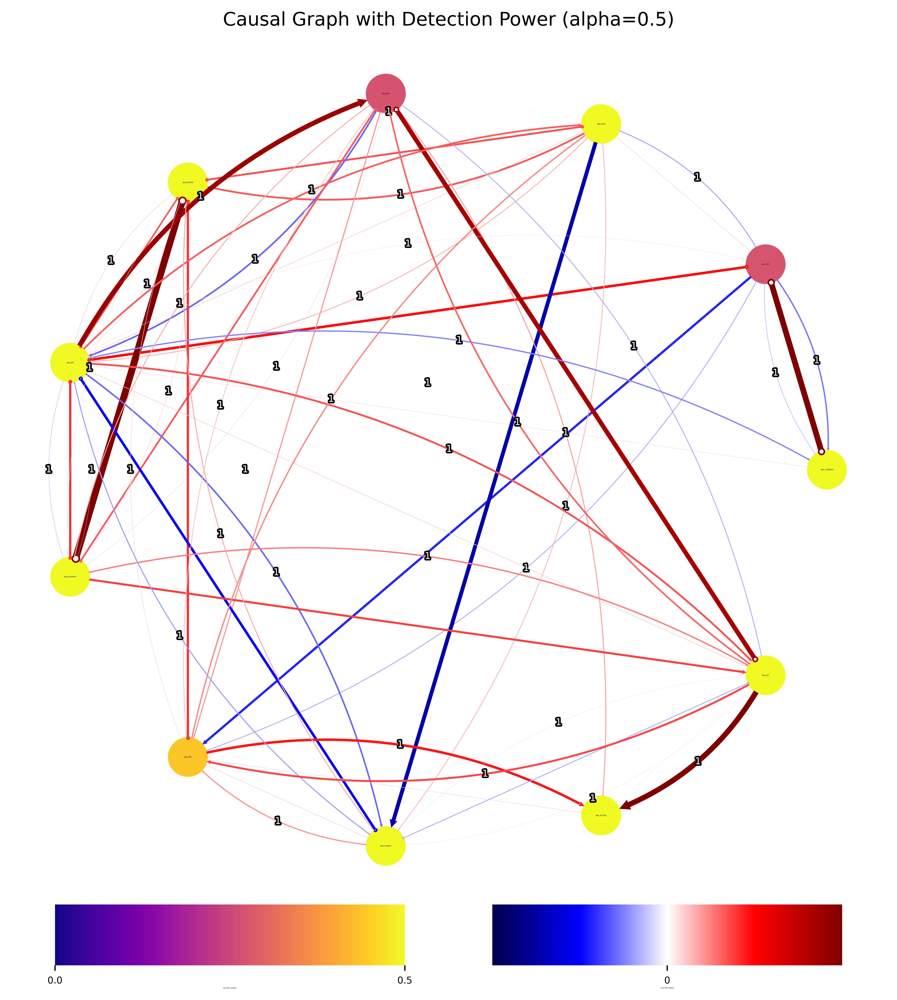

In [3]:
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tigramite.data_processing import DataFrame
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.robust_parcorr import RobustParCorr
from tigramite.plotting import plot_graph

# Define the directory and file pattern
directory = r"C:\CA_ME\driver"
file_pattern = os.path.join(directory, "data_*.csv")

# Read all matching CSV files and combine data
csv_files = glob.glob(file_pattern)

# Dictionary to store data using file names as keys
data_frames = {}

# Loop through each file and read the content
for file in csv_files:
    # Extract the base filename (without extension) for labeling
    file_label = os.path.splitext(os.path.basename(file))[0]
    
    # Read CSV into a DataFrame
    df = pd.read_csv(file)
    
    # Ensure the 'record' column is parsed as datetime
    if 'record' in df.columns and 'IITKGP' in df.columns:
        df['record'] = pd.to_datetime(df['record'])
    else:
        raise ValueError(f"Columns 'record' or 'IITKGP' not found in {file_label}")
    
    # Store the DataFrame
    data_frames[file_label] = df.set_index('record')['IITKGP']

# Combine all DataFrames on the 'record' (time) index
combined_data = pd.concat(data_frames.values(), axis=1)
combined_data.columns = data_frames.keys()  # Use file names as column names
combined_data = combined_data.dropna()  # Drop rows with missing values

# Convert combined data to numpy array
data_array = combined_data.values

# Prepare data for PCMCI+
dataframe = DataFrame(data_array, var_names=combined_data.columns.tolist())

# Set up independence test (RobustParCorr for Robust Partial Correlation)
robust_parcorr = RobustParCorr()  # Use RobustParCorr

# Run PCMCI+ with RobustParCorr as the independence test
pcmci = PCMCI(dataframe=dataframe, cond_ind_test=robust_parcorr)
max_lag = 1  # Maximum lag to consider
alpha = 0.5  # Significance level for causal links
results = pcmci.run_pcmciplus(tau_max=max_lag, pc_alpha=alpha)

# Print causal links and significant relationships
print("Causal links (with lags):")
print(results['graph'])

# Extract significant links based on symbolic representations in the graph
significant_links = results['graph']

# Print significant causal links, excluding self-links
print(f"Significant links at alpha={alpha}:")

for i, var_i in enumerate(combined_data.columns):
    for j, var_j in enumerate(combined_data.columns):
        # Skip self-links
        if var_i == var_j:
            continue
        
        # Check if the entry is a list/array and if it contains one of the significant links
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                print(f"Significant link: {var_i} -> {var_j}")
        else:
            # If it's not a list or array, check directly
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                print(f"Significant link: {var_i} -> {var_j}")

# Prepare the color matrix for the plot (using corrected p-values)
q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh',
                                         exclude_contemporaneous=False)

# Define the minimum significant value for the links and thresholding
min_sig = 0.2
vminmax = 0.4

# Create the binary graph based on significant links
# This checks if any significant link is one of the desired types
graph = np.zeros_like(significant_links, dtype=bool)

for i in range(significant_links.shape[0]):
    for j in range(significant_links.shape[1]):
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                graph[i, j] = True
        else:
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                graph[i, j] = True

# Plot the causal graph with link width based on PCMCI values
plot_graph(
    val_matrix=results['val_matrix'],
    graph=graph,  # Binary graph where significant links are True
    var_names=combined_data.columns.tolist(),
    link_width=np.abs(results['val_matrix']),  # Use the absolute values of PCMCI for link width
    vmin_edges=-vminmax,  # Set the color range for edges
    vmax_edges=vminmax,  # Set the color range for edges
    link_colorbar_label='cross-MCI (edges)',  # Label for the link colorbar
    node_colorbar_label='auto-MCI (nodes)'  # Label for the node colorbar
)

# Adjust plot settings
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 3000
plt.title(f"Causal Graph with Detection Power (alpha={alpha})")

# Show the plot
plt.show()


In [ ]:
#                                                  ParCorrWLS

Causal links (with lags):
[[['' '-->']
  ['-->' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['-->' '']
  ['' '']
  ['' '']
  ['' '']]

 [['<--' '-->']
  ['' '-->']
  ['-->' '']
  ['' '']
  ['x-x' '']
  ['x-x' '']
  ['x-x' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']]

 [['' '']
  ['<--' '']
  ['' '-->']
  ['' '-->']
  ['-->' '-->']
  ['x-x' '']
  ['' '']
  ['' '-->']
  ['x-x' '-->']
  ['x-x' '']
  ['' '']]

 [['' '-->']
  ['' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['x-x' '-->']
  ['x-x' '']
  ['' '']
  ['<--' '']
  ['' '-->']
  ['x-x' '']]

 [['' '']
  ['x-x' '']
  ['<--' '-->']
  ['' '']
  ['' '-->']
  ['' '']
  ['x-x' '-->']
  ['<--' '']
  ['x-x' '']
  ['x-x' '']
  ['' '']]

 [['' '-->']
  ['x-x' '']
  ['x-x' '']
  ['x-x' '-->']
  ['' '']
  ['' '-->']
  ['' '-->']
  ['' '']
  ['' '-->']
  ['' '-->']
  ['' '']]

 [['' '']
  ['x-x' '']
  ['' '']
  ['x-x' '']
  ['x-x' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '']]

 [['<--' '']
  ['x-x' '']
  ['' '-

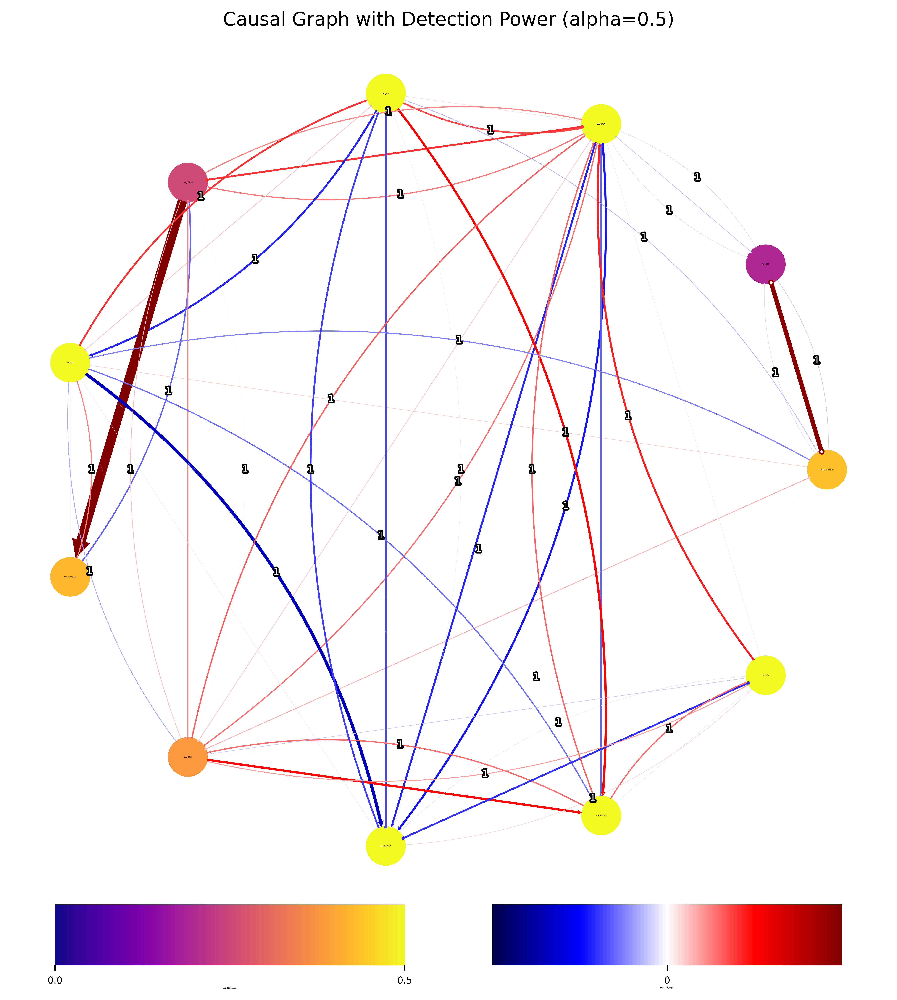

In [7]:
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tigramite.data_processing import DataFrame
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.parcorr_wls import ParCorrWLS  # Correct import of ParCorrWLS
from tigramite.plotting import plot_graph

# Define the directory and file pattern
directory = r"C:\CA_ME\driver"
file_pattern = os.path.join(directory, "data_*.csv")

# Read all matching CSV files and combine data
csv_files = glob.glob(file_pattern)

# Dictionary to store data using file names as keys
data_frames = {}

# Loop through each file and read the content
for file in csv_files:
    # Extract the base filename (without extension) for labeling
    file_label = os.path.splitext(os.path.basename(file))[0]
    
    # Read CSV into a DataFrame
    df = pd.read_csv(file)
    
    # Ensure the 'record' column is parsed as datetime
    if 'record' in df.columns and 'IITKGP' in df.columns:
        df['record'] = pd.to_datetime(df['record'])
    else:
        raise ValueError(f"Columns 'record' or 'IITKGP' not found in {file_label}")
    
    # Store the DataFrame
    data_frames[file_label] = df.set_index('record')['IITKGP']

# Combine all DataFrames on the 'record' (time) index
combined_data = pd.concat(data_frames.values(), axis=1)
combined_data.columns = data_frames.keys()  # Use file names as column names
combined_data = combined_data.dropna()  # Drop rows with missing values

# Convert combined data to numpy array
data_array = combined_data.values

# Prepare data for PCMCI+
dataframe = DataFrame(data_array, var_names=combined_data.columns.tolist())

# Set up independence test (ParCorrWLS with significance='analytic')
parcorr_wls = ParCorrWLS(significance='analytic')  # Use ParCorrWLS with analytic significance

# Run PCMCI+ with ParCorrWLS as the independence test
pcmci = PCMCI(dataframe=dataframe, cond_ind_test=parcorr_wls)
max_lag = 1  # Maximum lag to consider
alpha = 0.5  # Significance level for causal links
results = pcmci.run_pcmciplus(tau_max=max_lag, pc_alpha=alpha)

# Print causal links and significant relationships
print("Causal links (with lags):")
print(results['graph'])

# Extract significant links based on symbolic representations in the graph
significant_links = results['graph']

# Print significant causal links, excluding self-links
print(f"Significant links at alpha={alpha}:")

for i, var_i in enumerate(combined_data.columns):
    for j, var_j in enumerate(combined_data.columns):
        # Skip self-links
        if var_i == var_j:
            continue
        
        # Check if the entry is a list/array and if it contains one of the significant links
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                print(f"Significant link: {var_i} -> {var_j}")
        else:
            # If it's not a list or array, check directly
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                print(f"Significant link: {var_i} -> {var_j}")

# Prepare the color matrix for the plot (using corrected p-values)
q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh',
                                         exclude_contemporaneous=False)

# Define the minimum significant value for the links and thresholding
min_sig = 0.2
vminmax = 0.4

# Create the binary graph based on significant links
# This checks if any significant link is one of the desired types
graph = np.zeros_like(significant_links, dtype=bool)

for i in range(significant_links.shape[0]):
    for j in range(significant_links.shape[1]):
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                graph[i, j] = True
        else:
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                graph[i, j] = True

# Plot the causal graph with link width based on PCMCI values
plot_graph(
    val_matrix=results['val_matrix'],
    graph=graph,  # Binary graph where significant links are True
    var_names=combined_data.columns.tolist(),
    link_width=np.abs(results['val_matrix']),  # Use the absolute values of PCMCI for link width
    vmin_edges=-vminmax,  # Set the color range for edges
    vmax_edges=vminmax,  # Set the color range for edges
    link_colorbar_label='cross-MCI (edges)',  # Label for the link colorbar
    node_colorbar_label='auto-MCI (nodes)'  # Label for the node colorbar
)

# Adjust plot settings
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 720
plt.title(f"Causal Graph with Detection Power (alpha={alpha})")

# Show the plot
plt.show()


In [ ]:
#                                                 GPDC

C:\Users\Subhadeep Maishal\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\Subhadeep Maishal\anaconda3\Lib\site-packages\sklearn\gaussian_process\_gpr.py:659: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
C:\Users\Subhadeep Maishal\anaconda3\Lib\site-packages\sklearn\gaussian_process\_gpr.py:659: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.htm

Causal links (with lags):
[[['' '-->']
  ['x-x' '-->']
  ['' '']
  ['-->' '']
  ['' '']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '-->']
  ['' '']
  ['x-x' '']]

 [['x-x' '-->']
  ['' '-->']
  ['' '']
  ['' '']
  ['x-x' '']
  ['x-x' '-->']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['x-x' '']]

 [['' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['-->' '-->']
  ['' '']
  ['' '']
  ['<--' '']
  ['x-x' '']
  ['x-x' '']]

 [['<--' '']
  ['' '']
  ['' '-->']
  ['' '-->']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['<--' '']
  ['' '-->']
  ['x-x' '']]

 [['' '']
  ['x-x' '']
  ['' '']
  ['x-x' '-->']
  ['' '-->']
  ['x-x' '']
  ['<--' '']
  ['x-x' '']
  ['' '']
  ['x-x' '']
  ['' '-->']]

 [['' '']
  ['x-x' '']
  ['<--' '-->']
  ['' '-->']
  ['x-x' '']
  ['' '-->']
  ['' '']
  ['<--' '']
  ['' '-->']
  ['x-x' '']
  ['' '']]

 [['' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['-->' '-->']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '']]

 [['x-x' '']
  ['' '']
  ['' '-->']
 

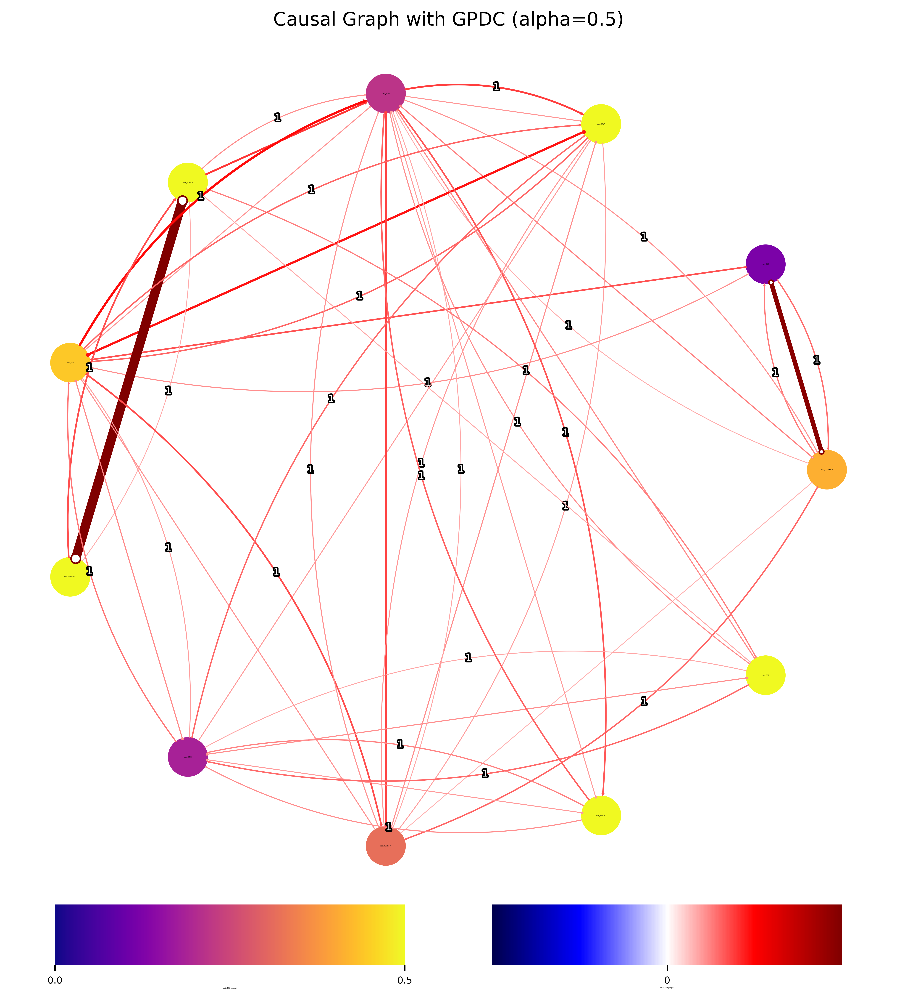

In [8]:
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tigramite.data_processing import DataFrame
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.gpdc import GPDC  # Import GPDC
from tigramite.plotting import plot_graph

# Define the directory and file pattern
directory = r"C:\CA_ME\driver"
file_pattern = os.path.join(directory, "data_*.csv")

# Read all matching CSV files and combine data
csv_files = glob.glob(file_pattern)

# Dictionary to store data using file names as keys
data_frames = {}

# Loop through each file and read the content
for file in csv_files:
    # Extract the base filename (without extension) for labeling
    file_label = os.path.splitext(os.path.basename(file))[0]
    
    # Read CSV into a DataFrame
    df = pd.read_csv(file)
    
    # Ensure the 'record' column is parsed as datetime
    if 'record' in df.columns and 'IITKGP' in df.columns:
        df['record'] = pd.to_datetime(df['record'])
    else:
        raise ValueError(f"Columns 'record' or 'IITKGP' not found in {file_label}")
    
    # Store the DataFrame
    data_frames[file_label] = df.set_index('record')['IITKGP']

# Combine all DataFrames on the 'record' (time) index
combined_data = pd.concat(data_frames.values(), axis=1)
combined_data.columns = data_frames.keys()  # Use file names as column names
combined_data = combined_data.dropna()  # Drop rows with missing values

# Convert combined data to numpy array
data_array = combined_data.values

# Prepare data for PCMCI+
dataframe = DataFrame(data_array, var_names=combined_data.columns.tolist())

# Set up independence test (GPDC for Generalized Partial Directed Correlation)
gpdc = GPDC()  # Use GPDC method for independence test

# Run PCMCI+ with GPDC as the independence test
pcmci = PCMCI(dataframe=dataframe, cond_ind_test=gpdc)
max_lag = 1  # Maximum lag to consider
alpha = 0.5  # Significance level for causal links
results = pcmci.run_pcmciplus(tau_max=max_lag, pc_alpha=alpha)

# Print causal links and significant relationships
print("Causal links (with lags):")
print(results['graph'])

# Extract significant links based on symbolic representations in the graph
significant_links = results['graph']

# Print significant causal links, excluding self-links
print(f"Significant links at alpha={alpha}:")

for i, var_i in enumerate(combined_data.columns):
    for j, var_j in enumerate(combined_data.columns):
        # Skip self-links
        if var_i == var_j:
            continue
        
        # Check if the entry is a list/array and if it contains one of the significant links
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                print(f"Significant link: {var_i} -> {var_j}")
        else:
            # If it's not a list or array, check directly
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                print(f"Significant link: {var_i} -> {var_j}")

# Prepare the color matrix for the plot (using corrected p-values)
q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh',
                                         exclude_contemporaneous=False)

# Define the minimum significant value for the links and thresholding
min_sig = 0.2
vminmax = 0.4

# Create the binary graph based on significant links
# This checks if any significant link is one of the desired types
graph = np.zeros_like(significant_links, dtype=bool)

for i in range(significant_links.shape[0]):
    for j in range(significant_links.shape[1]):
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                graph[i, j] = True
        else:
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                graph[i, j] = True

# Plot the causal graph with link width based on PCMCI values
plot_graph(
    val_matrix=results['val_matrix'],
    graph=graph,  # Binary graph where significant links are True
    var_names=combined_data.columns.tolist(),
    link_width=np.abs(results['val_matrix']),  # Use the absolute values of PCMCI for link width
    vmin_edges=-vminmax,  # Set the color range for edges
    vmax_edges=vminmax,  # Set the color range for edges
    link_colorbar_label='cross-MCI (edges)',  # Label for the link colorbar
    node_colorbar_label='auto-MCI (nodes)'  # Label for the node colorbar
)

# Adjust plot settings
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 720
plt.title(f"Causal Graph with GPDC (alpha={alpha})")

# Show the plot
plt.show()


In [ ]:
#                                            CMI-Knn

Causal links (with lags):
[[['' '-->']
  ['o-o' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']]

 [['o-o' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']]

 [['' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']]

 [['' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '-->']
  ['' '']]

 [['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '-->']
  ['-->' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']]

 [['' '']
  ['x-x' '']
  ['x-x' '-->']
  ['' '-->']
  ['<--' '-->']
  ['' '-->']
  ['' '-->']
  ['' '']
  ['' '-->']
  ['<--' '']
  ['<--' '']]

 [['' '']
  ['' '']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['' '']]

 [['' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '-->']
  ['' '']
  ['' '']
  [

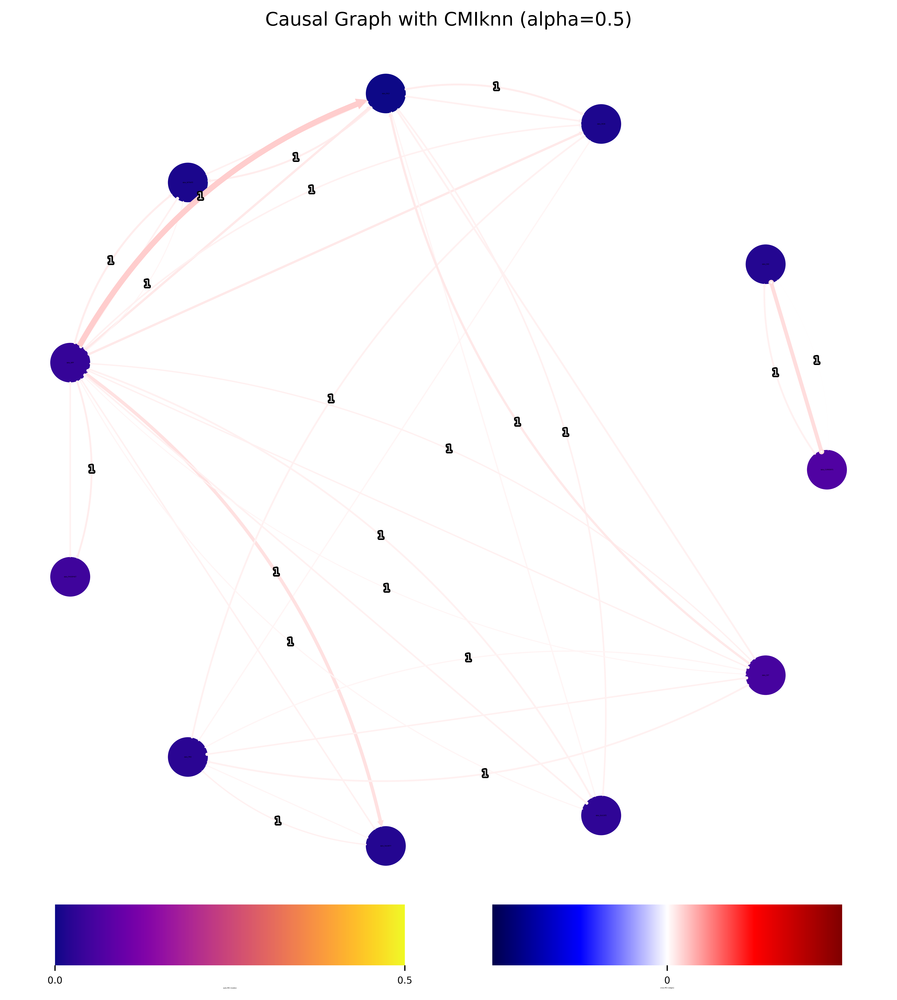

In [12]:
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tigramite.data_processing import DataFrame
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.cmiknn import CMIknn  # Import CMIknn directly from cmiknn.py
from tigramite.plotting import plot_graph

# Define the directory and file pattern
directory = r"C:\CA_ME\driver"
file_pattern = os.path.join(directory, "data_*.csv")

# Read all matching CSV files and combine data
csv_files = glob.glob(file_pattern)

# Dictionary to store data using file names as keys
data_frames = {}

# Loop through each file and read the content
for file in csv_files:
    # Extract the base filename (without extension) for labeling
    file_label = os.path.splitext(os.path.basename(file))[0]
    
    # Read CSV into a DataFrame
    df = pd.read_csv(file)
    
    # Ensure the 'record' column is parsed as datetime
    if 'record' in df.columns and 'IITKGP' in df.columns:
        df['record'] = pd.to_datetime(df['record'])
    else:
        raise ValueError(f"Columns 'record' or 'IITKGP' not found in {file_label}")
    
    # Store the DataFrame
    data_frames[file_label] = df.set_index('record')['IITKGP']

# Combine all DataFrames on the 'record' (time) index
combined_data = pd.concat(data_frames.values(), axis=1)
combined_data.columns = data_frames.keys()  # Use file names as column names
combined_data = combined_data.dropna()  # Drop rows with missing values

# Convert combined data to numpy array
data_array = combined_data.values

# Prepare data for PCMCI+
dataframe = DataFrame(data_array, var_names=combined_data.columns.tolist())

# Set up independence test (CMIknn for Conditional Mutual Information)
cmi_knn = CMIknn()  # Use CMIknn

# Run PCMCI+ with CMIknn as the independence test
pcmci = PCMCI(dataframe=dataframe, cond_ind_test=cmi_knn)
max_lag = 1  # Maximum lag to consider
alpha = 0.5  # Significance level for causal links
results = pcmci.run_pcmciplus(tau_max=max_lag, pc_alpha=alpha)

# Print causal links and significant relationships
print("Causal links (with lags):")
print(results['graph'])

# Extract significant links based on symbolic representations in the graph
significant_links = results['graph']

# Print significant causal links, excluding self-links
print(f"Significant links at alpha={alpha}:")

for i, var_i in enumerate(combined_data.columns):
    for j, var_j in enumerate(combined_data.columns):
        # Skip self-links
        if var_i == var_j:
            continue
        
        # Check if the entry is a list/array and if it contains one of the significant links
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                print(f"Significant link: {var_i} -> {var_j}")
        else:
            # If it's not a list or array, check directly
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                print(f"Significant link: {var_i} -> {var_j}")

# Prepare the color matrix for the plot (using corrected p-values)
q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh',
                                         exclude_contemporaneous=False)

# Define the minimum significant value for the links and thresholding
min_sig = 0.2
vminmax = 0.4

# Create the binary graph based on significant links
# This checks if any significant link is one of the desired types
graph = np.zeros_like(significant_links, dtype=bool)

for i in range(significant_links.shape[0]):
    for j in range(significant_links.shape[1]):
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                graph[i, j] = True
        else:
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                graph[i, j] = True

# Plot the causal graph with link width based on PCMCI values
plot_graph(
    val_matrix=results['val_matrix'],
    graph=graph,  # Binary graph where significant links are True
    var_names=combined_data.columns.tolist(),
    link_width=np.abs(results['val_matrix']),  # Use the absolute values of PCMCI for link width
    vmin_edges=-vminmax,  # Set the color range for edges
    vmax_edges=vminmax,  # Set the color range for edges
    link_colorbar_label='cross-MCI (edges)',  # Label for the link colorbar
    node_colorbar_label='auto-MCI (nodes)'  # Label for the node colorbar
)

# Adjust plot settings
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 720
plt.title(f"Causal Graph with CMIknn (alpha={alpha})")

# Show the plot
plt.show()


In [ ]:
#                                      ::       J-PCMCI+         ::

Causal links (with lags):
[[['' '-->']
  ['x-x' '-->']
  ['' '']
  ['' '']
  ['x-x' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']
  ['' '']]

 [['x-x' '-->']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['<--' '']
  ['x-x' '']
  ['x-x' '-->']
  ['' '']
  ['' '']
  ['' '']]

 [['' '']
  ['' '-->']
  ['' '-->']
  ['' '']
  ['-->' '-->']
  ['' '-->']
  ['' '']
  ['' '']
  ['x-x' '-->']
  ['x-x' '']
  ['x-x' '']]

 [['' '']
  ['' '']
  ['' '']
  ['' '-->']
  ['x-x' '']
  ['' '-->']
  ['<--' '']
  ['x-x' '']
  ['x-x' '']
  ['' '-->']
  ['<--' '-->']]

 [['x-x' '']
  ['' '']
  ['<--' '']
  ['x-x' '']
  ['' '-->']
  ['-->' '']
  ['<--' '']
  ['-->' '']
  ['' '']
  ['x-x' '']
  ['' '']]

 [['' '-->']
  ['-->' '']
  ['' '-->']
  ['' '-->']
  ['<--' '']
  ['' '-->']
  ['<--' '']
  ['' '']
  ['x-x' '-->']
  ['' '']
  ['' '-->']]

 [['' '']
  ['x-x' '']
  ['' '']
  ['-->' '-->']
  ['-->' '']
  ['-->' '']
  ['' '-->']
  ['' '']
  ['' '']
  ['' '']
  ['x-x' '-->']]

 [['' '']
  ['x-x' '']
  

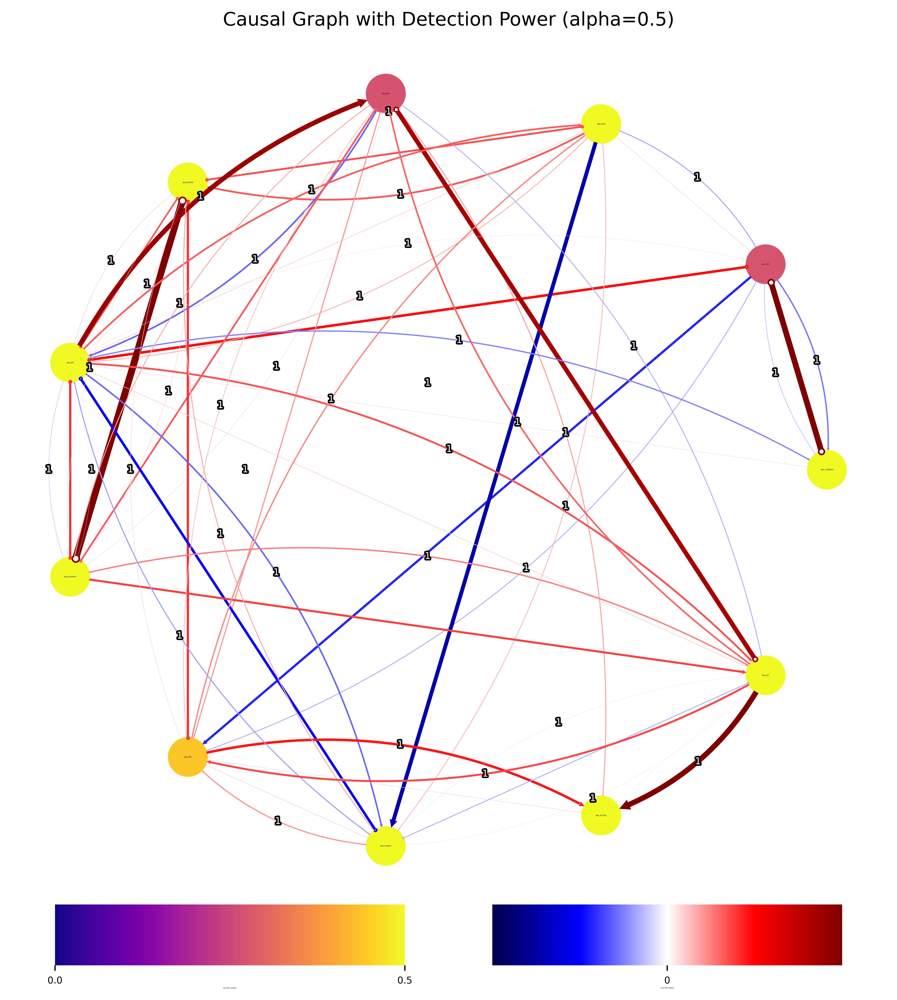

In [20]:
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tigramite.data_processing import DataFrame
from tigramite.jpcmciplus import JPCMCIplus  # Corrected import
from tigramite.independence_tests.robust_parcorr import RobustParCorr
from tigramite.plotting import plot_graph

# Define the directory and file pattern
directory = r"C:\CA_ME\driver"
file_pattern = os.path.join(directory, "data_*.csv")

# Read all matching CSV files and combine data
csv_files = glob.glob(file_pattern)

# Dictionary to store data using file names as keys
data_frames = {}

# Loop through each file and read the content
for file in csv_files:
    # Extract the base filename (without extension) for labeling
    file_label = os.path.splitext(os.path.basename(file))[0]
    
    # Read CSV into a DataFrame
    df = pd.read_csv(file)
    
    # Ensure the 'record' column is parsed as datetime
    if 'record' in df.columns and 'IITKGP' in df.columns:
        df['record'] = pd.to_datetime(df['record'])
    else:
        raise ValueError(f"Columns 'record' or 'IITKGP' not found in {file_label}")
    
    # Store the DataFrame
    data_frames[file_label] = df.set_index('record')['IITKGP']

# Combine all DataFrames on the 'record' (time) index
combined_data = pd.concat(data_frames.values(), axis=1)
combined_data.columns = data_frames.keys()  # Use file names as column names
combined_data = combined_data.dropna()  # Drop rows with missing values

# Convert combined data to numpy array
data_array = combined_data.values

# Prepare data for J-PCMCI+
dataframe = DataFrame(data_array, var_names=combined_data.columns.tolist())

# Set up independence test (RobustParCorr for Robust Partial Correlation)
robust_parcorr = RobustParCorr()  # Use RobustParCorr

# Define node classification (adjust based on your context)
node_classification = np.zeros(len(combined_data.columns))  # Example: all nodes in one group

# Run J-PCMCI+ with RobustParCorr as the independence test and node classification
jpcmci = JPCMCIplus(dataframe=dataframe, cond_ind_test=robust_parcorr, node_classification=node_classification)
max_lag = 1  # Maximum lag to consider
alpha = 0.5  # Significance level for causal links
results = jpcmci.run_pcmciplus(tau_max=max_lag, pc_alpha=alpha)

# Print causal links and significant relationships
print("Causal links (with lags):")
print(results['graph'])

# Extract significant links based on symbolic representations in the graph
significant_links = results['graph']

# Print significant causal links, excluding self-links
print(f"Significant links at alpha={alpha}:")

for i, var_i in enumerate(combined_data.columns):
    for j, var_j in enumerate(combined_data.columns):
        # Skip self-links
        if var_i == var_j:
            continue
        
        # Check if the entry is a list/array and if it contains one of the significant links
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                print(f"Significant link: {var_i} -> {var_j}")
        else:
            # If it's not a list or array, check directly
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                print(f"Significant link: {var_i} -> {var_j}")

# Prepare the color matrix for the plot (using corrected p-values)
q_matrix = jpcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], fdr_method='fdr_bh',
                                         exclude_contemporaneous=False)

# Define the minimum significant value for the links and thresholding
min_sig = 0.2
vminmax = 0.4

# Create the binary graph based on significant links
# This checks if any significant link is one of the desired types
graph = np.zeros_like(significant_links, dtype=bool)

for i in range(significant_links.shape[0]):
    for j in range(significant_links.shape[1]):
        if isinstance(significant_links[i, j], (list, np.ndarray)):
            if any(link in ['-->', '<--', 'o-o'] for link in significant_links[i, j]):
                graph[i, j] = True
        else:
            if significant_links[i, j] in ['-->', '<--', 'o-o']:
                graph[i, j] = True

# Plot the causal graph with link width based on J-PCMCI+ values
plot_graph(
    val_matrix=results['val_matrix'],
    graph=graph,  # Binary graph where significant links are True
    var_names=combined_data.columns.tolist(),
    link_width=np.abs(results['val_matrix']),  # Use the absolute values of J-PCMCI+ for link width
    vmin_edges=-vminmax,  # Set the color range for edges
    vmax_edges=vminmax,  # Set the color range for edges
    link_colorbar_label='cross-MCI (edges)',  # Label for the link colorbar
    node_colorbar_label='auto-MCI (nodes)'  # Label for the node colorbar
)

# Adjust plot settings
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 3000
plt.title(f"Causal Graph with Detection Power (alpha={alpha})")

# Show the plot
plt.show()
